In [1]:
import numpy as np
import scipy as sp 
import scipy.ndimage as ndimage
import math
import cv2
import matplotlib.pyplot as plt
import os
import pandas as pd
from scipy import ndimage as ndi

import matplotlib
matplotlib.use('Agg')
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

import pandas as pd


#### Defining the functions for opical disc segmentation

1. Gamma correction
2. Linear stretching

In [2]:
def gammaCorrection(image,gamma):
    c = 255**(1-gamma)
    return (c *(image**gamma)).astype("uint8")

def linearStretching(img):
    hf_counts, hf_bins = np.histogram(img.flatten(), bins=256, range=(0,255))
    s1, s2 =  int(np.argwhere(hf_counts>0)[0]), int(np.argwhere(hf_counts>0)[-1])
    t1, t2 = 0, 255
    return ((img-s1)*((t2-t1)/(s2-s1)+t1)).astype("uint8")


#### Defining the functions for the performance evaluation of the segmentation

The evaluation metrics used is the intersection over union (IoU)

In [3]:
def evaluation(region_img, region_mask):
    intersection = np.sum(np.logical_and(region_img != 0, region_mask != 0))
    union = np.sum(np.logical_or(region_img != 0, region_mask != 0))

    if union != 0:
        iou = intersection / union
    else:
        iou = 0

    return iou

IoU for image, 1 is:  0.865296824967092


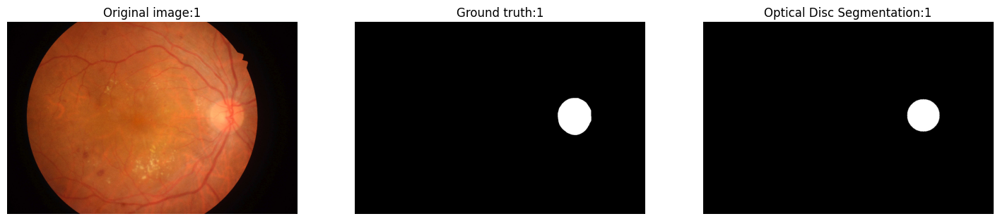

IoU for image, 2 is:  0.863189513926816


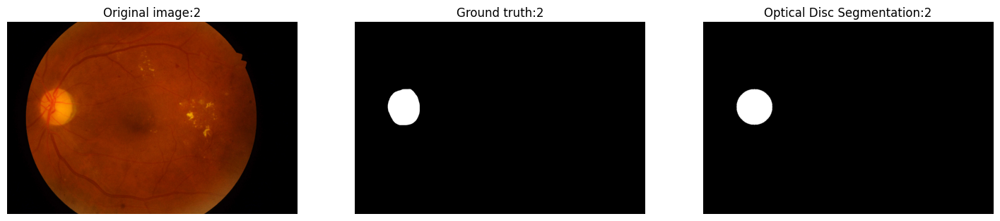

IoU for image, 3 is:  0.8791156057902042


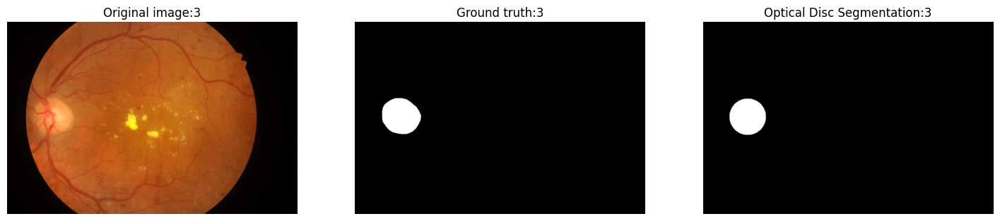

IoU for image, 4 is:  0.8935195077133455


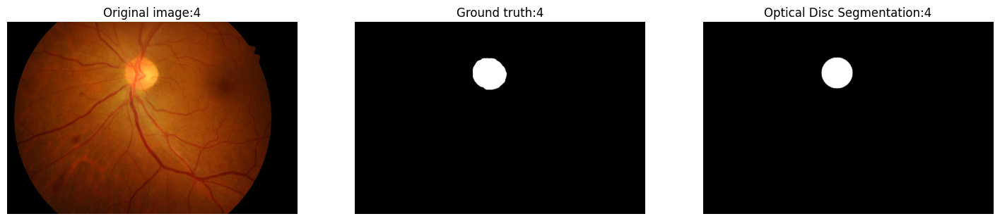

IoU for image, 5 is:  0.8269384822483008


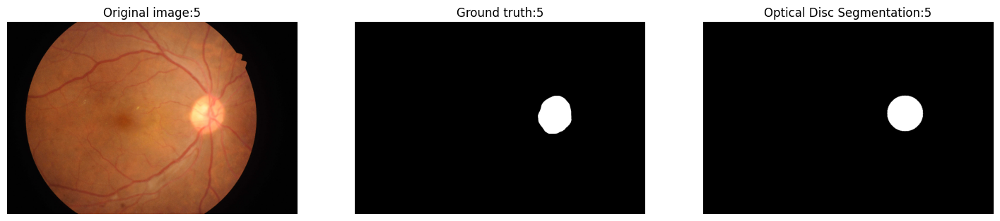

IoU for image, 6 is:  0.7862176320691779


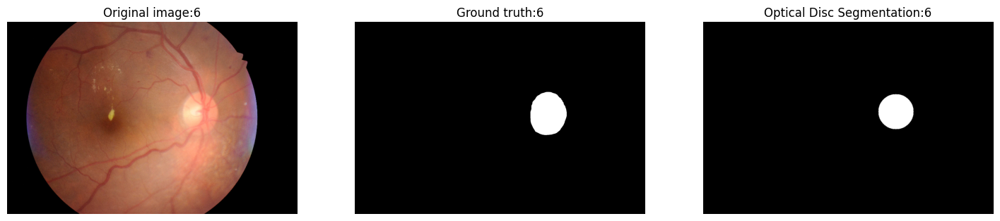

IoU for image, 7 is:  0.7842365746359223


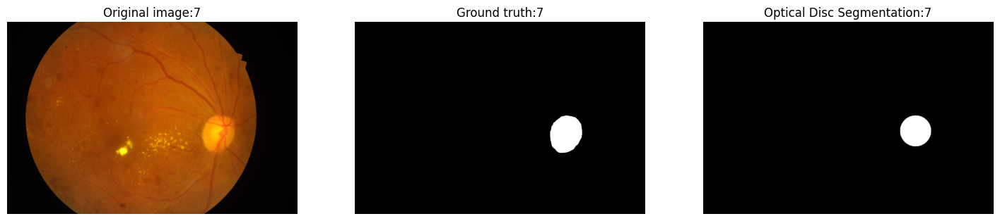

IoU for image, 8 is:  0.718252078403726


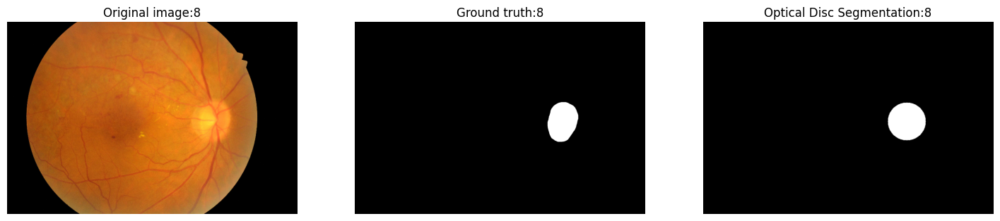

IoU for image, 9 is:  0.7441969699886423


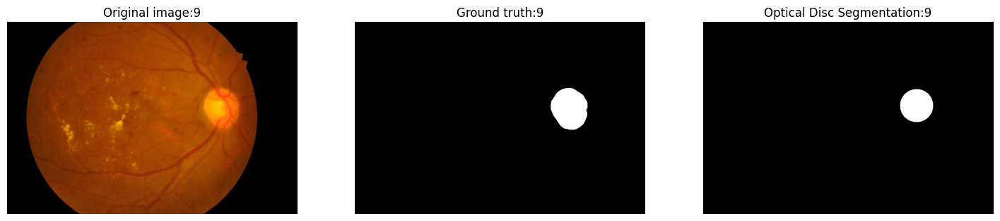

IoU for image, 10 is:  0.9186231111779352


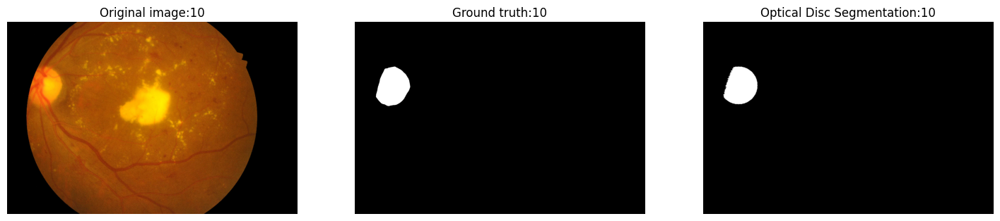

IoU for image, 11 is:  0.9247946611909651


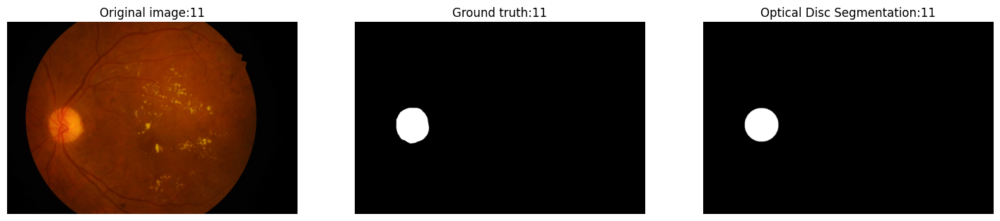

IoU for image, 12 is:  0.7406233491811939


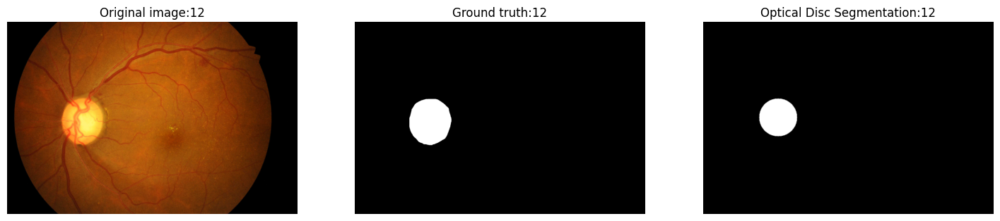

IoU for image, 13 is:  0.9010732532905064


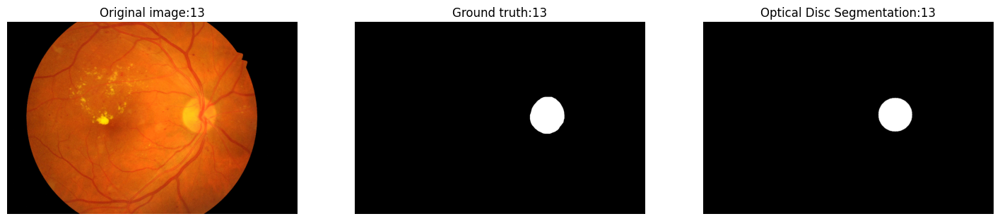

IoU for image, 14 is:  0.8694257073262133


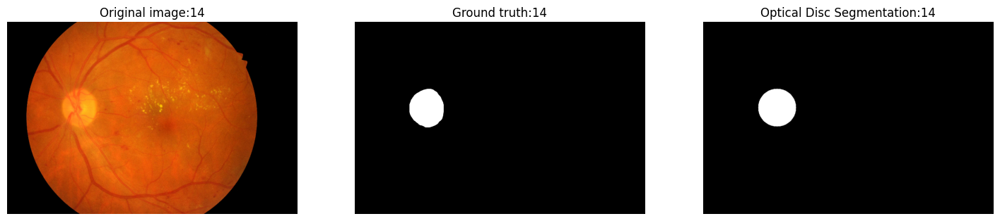

IoU for image, 15 is:  0.7800341680844781


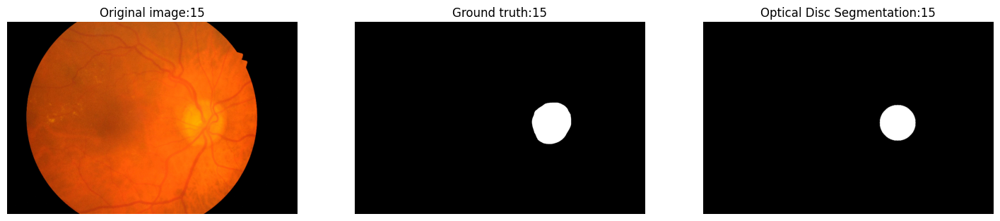

IoU for image, 16 is:  0.8253586591279503


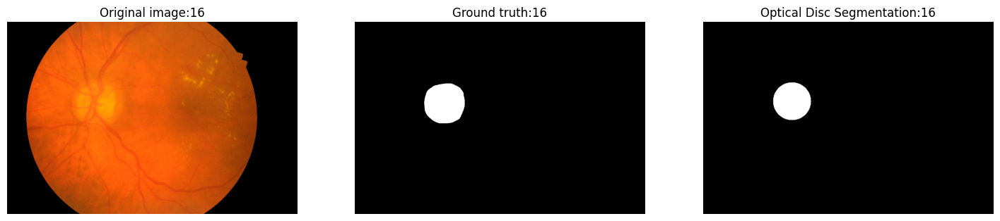

IoU for image, 17 is:  0.6917477713257545


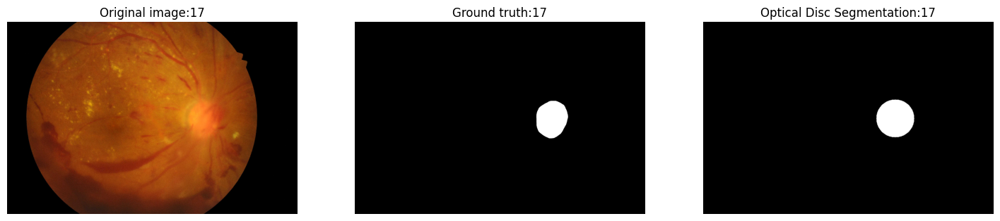

IoU for image, 18 is:  0.8333730528413892


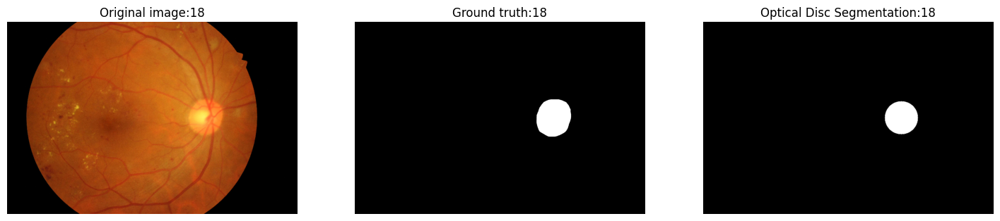

IoU for image, 19 is:  0.8680615597440775


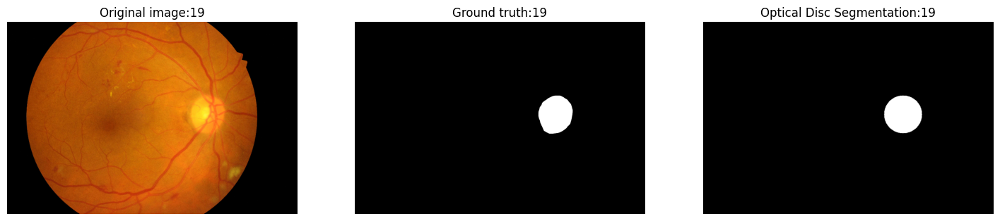

IoU for image, 20 is:  0.8180555912679026


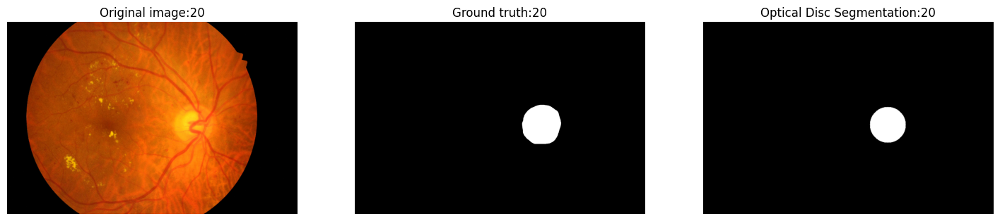

IoU for image, 21 is:  0.9116782871300737


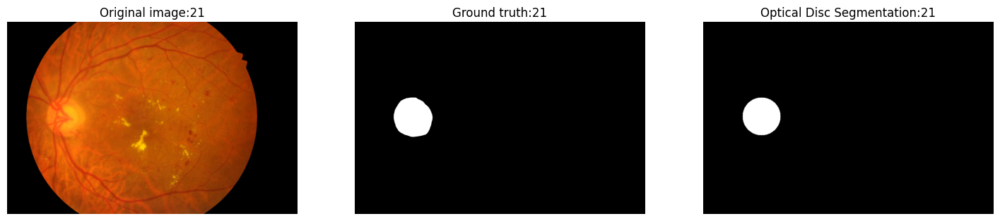

IoU for image, 22 is:  0.8353130067767122


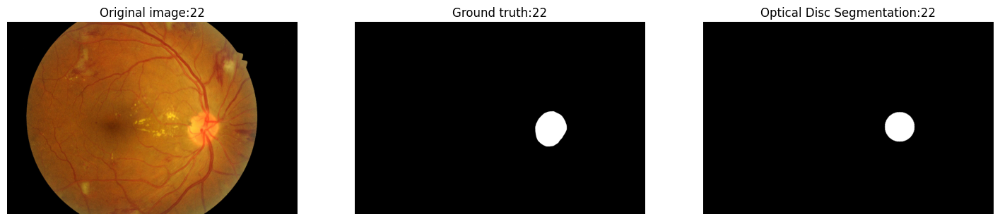

IoU for image, 23 is:  0.8566666961764211


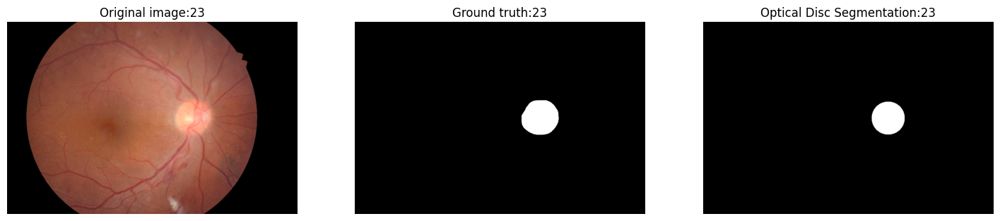

IoU for image, 24 is:  0.8992996041240702


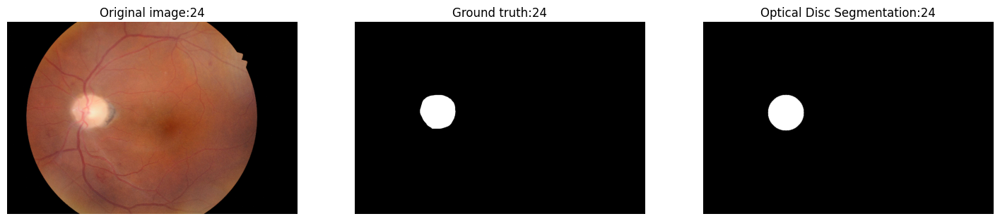

IoU for image, 25 is:  0.0


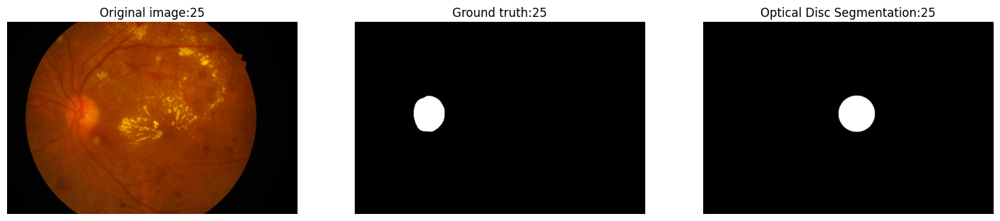

IoU for image, 26 is:  0.9421272604946075


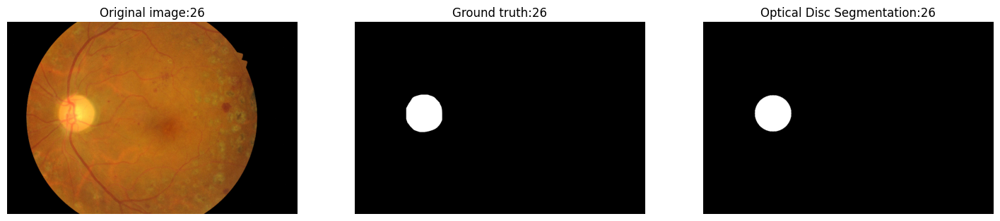

IoU for image, 27 is:  0.8349404997145743


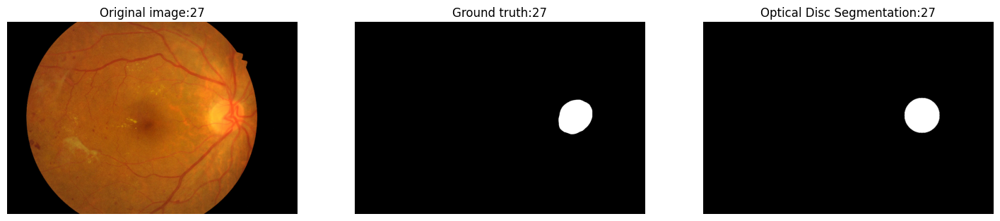

IoU for image, 28 is:  0.9101909205200924


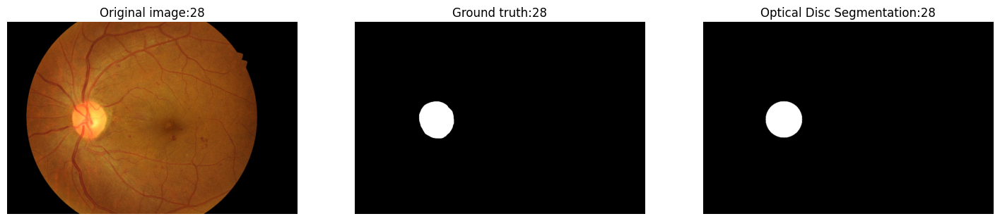

IoU for image, 29 is:  0.6579406485380215


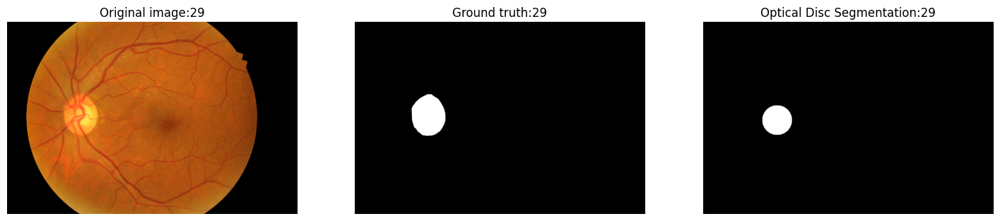

IoU for image, 30 is:  0.8517251404304804


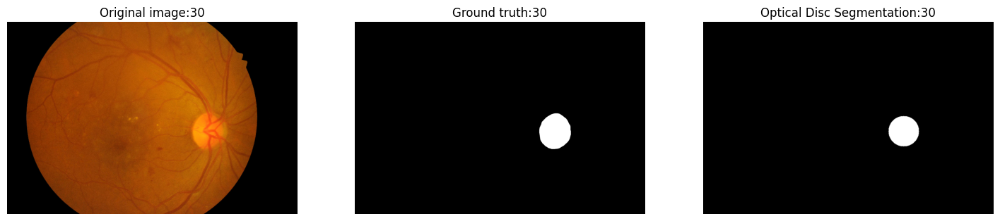

IoU for image, 31 is:  0.9072629217456651


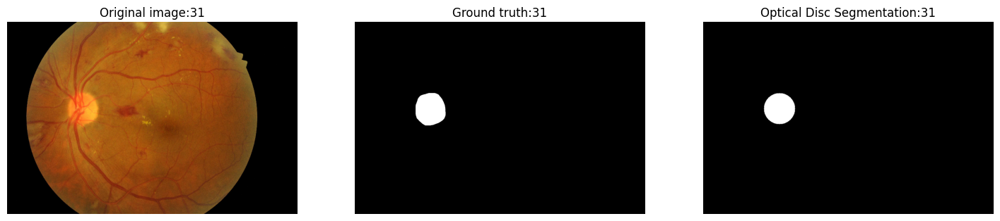

IoU for image, 32 is:  0.8506330306260945


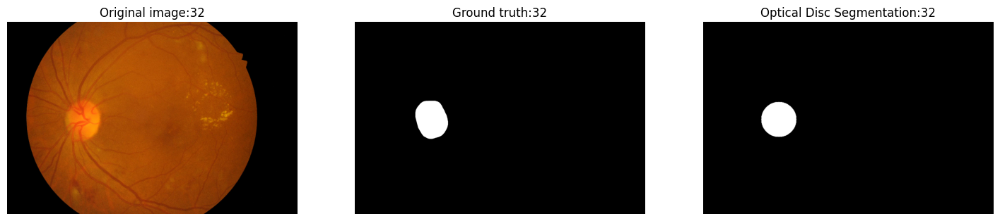

IoU for image, 33 is:  0.8779608930383261


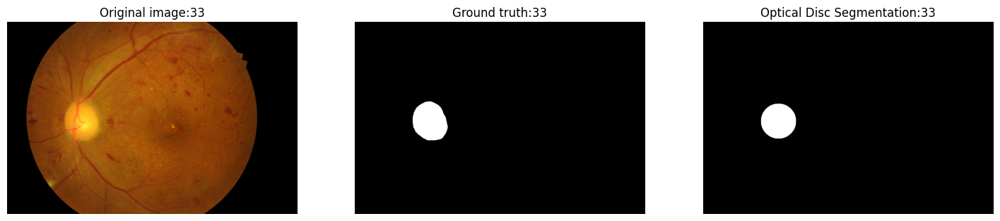

IoU for image, 34 is:  0.9394884883842067


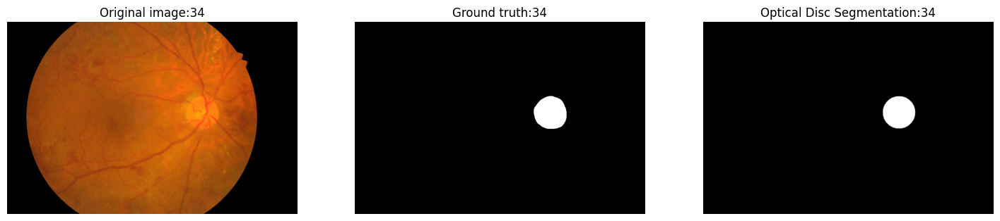

IoU for image, 35 is:  0.878839581539746


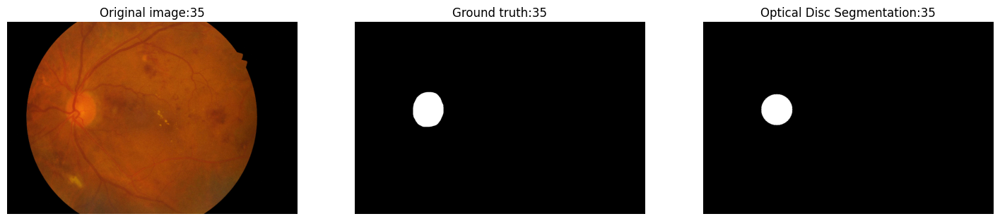

IoU for image, 36 is:  0.8463249437096054


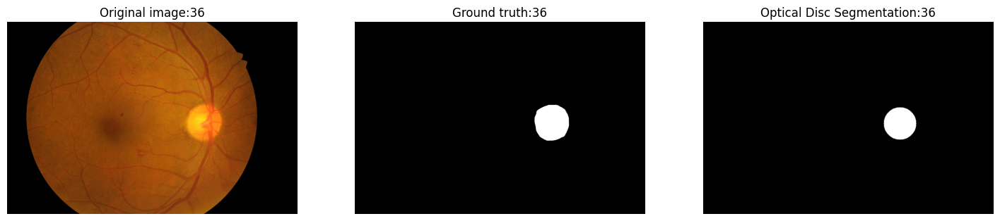

IoU for image, 37 is:  0.8726759128481789


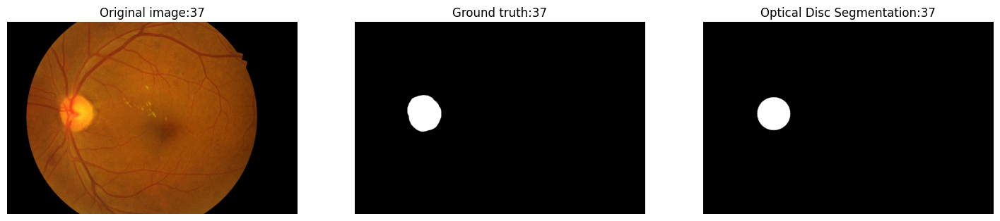

IoU for image, 38 is:  0.7690251171389412


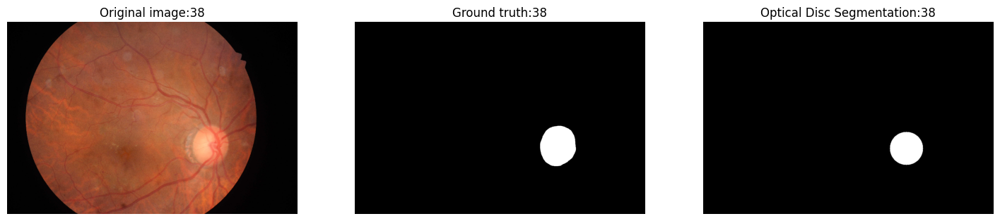

IoU for image, 39 is:  0.7915617578612106


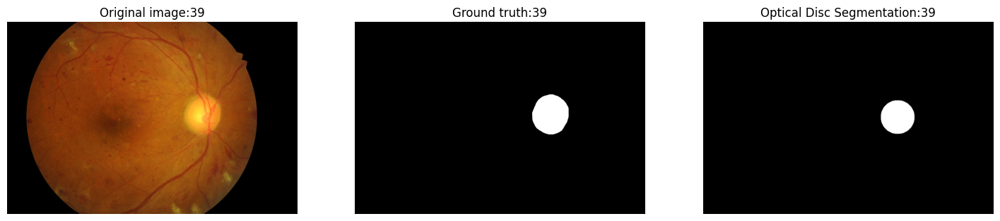

IoU for image, 40 is:  0.8867903225237368


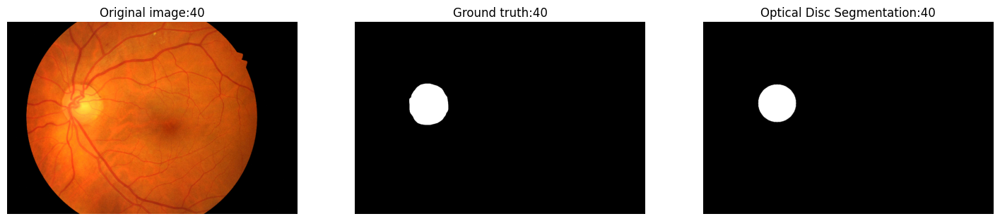

IoU for image, 41 is:  0.9054667661024629


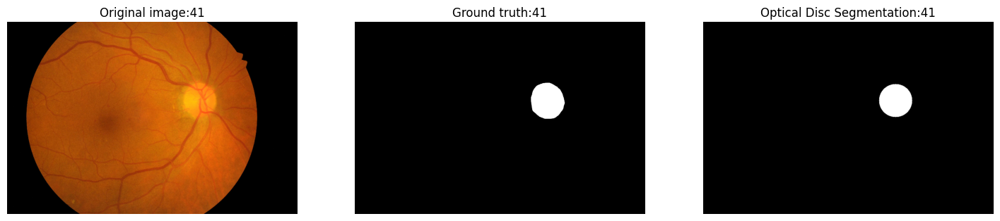

IoU for image, 42 is:  0.837519002736394


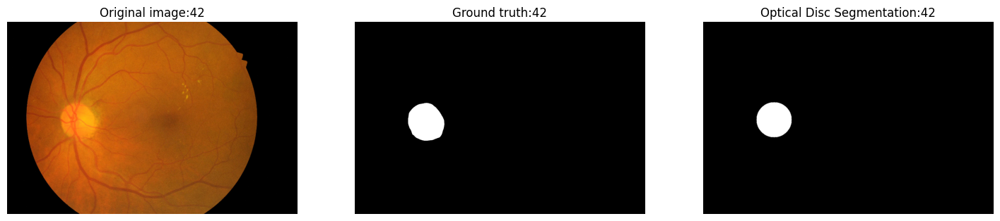

IoU for image, 43 is:  0.80214937478878


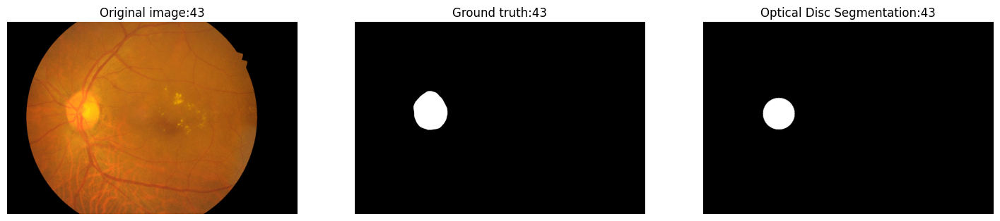

IoU for image, 44 is:  0.7571867085283441


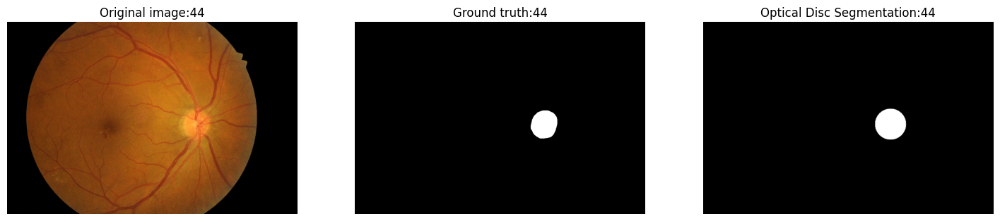

IoU for image, 45 is:  0.8698125575515427


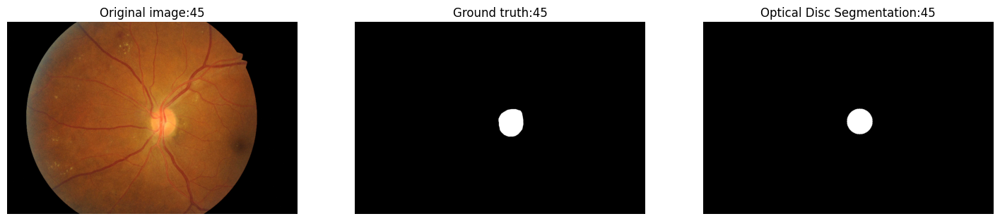

IoU for image, 46 is:  0.8770180072555102


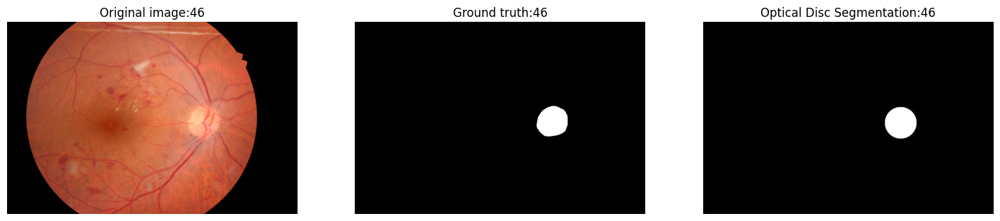

IoU for image, 47 is:  0.7830634193814021


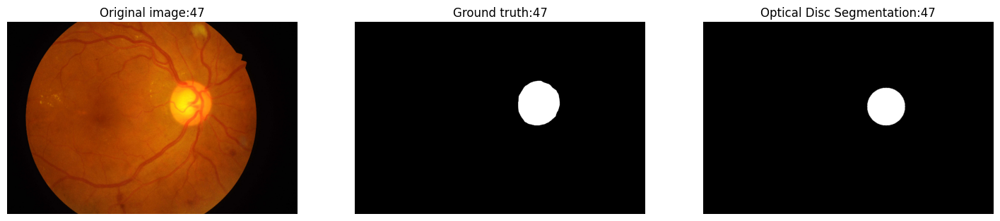

IoU for image, 48 is:  0.8043694559036255


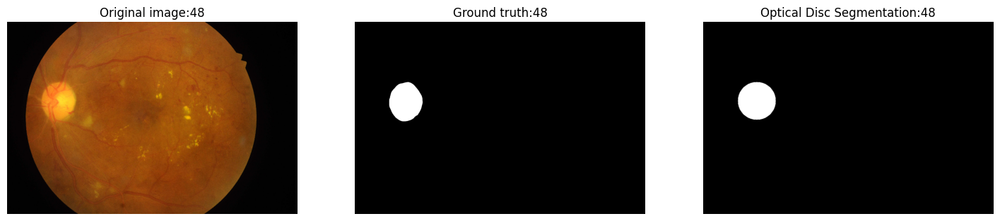

IoU for image, 49 is:  0.7998859638950094


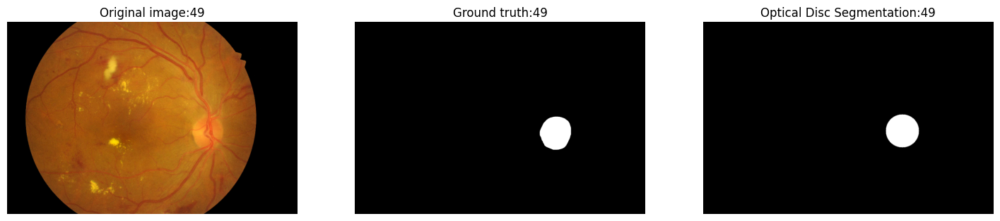

IoU for image, 50 is:  0.803697425791102


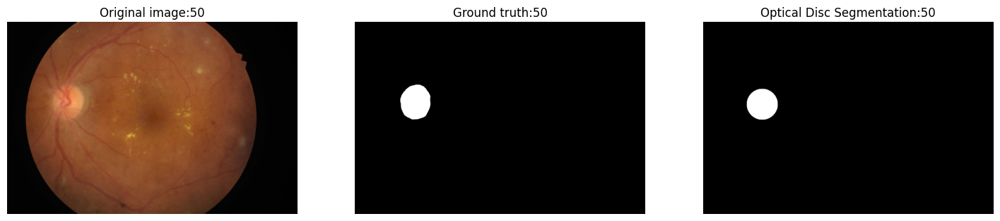

IoU for image, 51 is:  0.7749477747401986


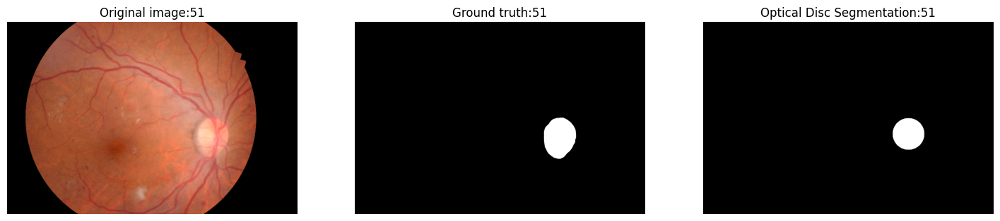

IoU for image, 52 is:  0.7857668081530387


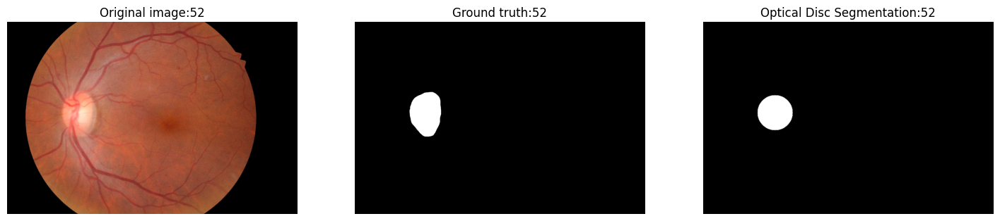

IoU for image, 53 is:  0.8122232661472418


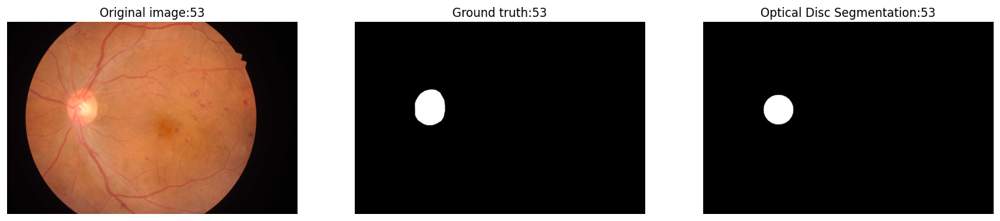

IoU for image, 54 is:  0.854028483719994


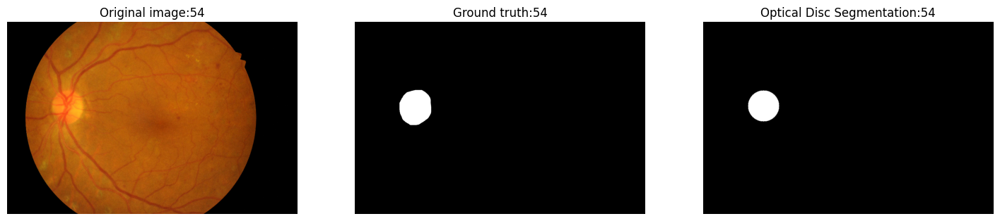

In [4]:
for image_number in range(1, 55):
    
# STEP1: LOAD THE DATASET
    
    # Load the training dataset
    formatted_number = str(image_number).zfill(2)
    img_path = f"Retinal Lesions Data/data/images/training/IDRiD_{formatted_number}.jpg"
    img1 = cv2.imread(img_path)
    img1 = cv2.resize(img1, dsize=None, fx=0.2, fy=0.2, interpolation=cv2.INTER_CUBIC)
    
    # Load the groundtruths
    img_path = f"optic disc/IDRiD_{formatted_number}_OD.tif"
    img_hex = cv2.imread(img_path)
    img_hex_gray = cv2.cvtColor(img_hex, cv2.COLOR_BGR2GRAY)
    th, img_hex_gray = cv2.threshold(img_hex_gray, 10, 255, cv2.THRESH_BINARY)


    
# STEP 2: OPTIC DISC REMOVAL

    # Set the background to zero
    _, _, red = cv2.split(img1)
    _, backgroundmask = cv2.threshold(red, thresh=30, maxval=1, type=cv2.THRESH_BINARY)
    image = cv2.bitwise_and(img1, img1, mask=backgroundmask)

    # Segmentation of the optical disc 
    image = cv2.pyrMeanShiftFiltering(image, sp=10, sr=20)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(30, 30))
    image = clahe.apply(gray)
    image = gammaCorrection(image, 2.5)
    image = linearStretching(image)
    circles = cv2.HoughCircles(image, method=cv2.HOUGH_GRADIENT, dp=1, minDist=5, param1=100, param2=10, minRadius=10, maxRadius=57)
    
    # Create a mask image with the same size as the original image
    mask = np.zeros_like(image)
    for i in range(len(circles)):
        circle = circles[0][i]
        center = (int(circle[0]), int(circle[1]))
        radius = int(circle[2])
        cv2.circle(mask, center, radius, 255, -1)  

    # Invert the mask and apply it to the original image to remove the region inside the circles    
    #inverted_mask = cv2.bitwise_not(mask)
    segmented_disc = cv2.bitwise_and(img1, img1, mask=mask)
    segmented_disc = cv2.cvtColor(segmented_disc, cv2.COLOR_BGR2GRAY)
    # Apply binary thresholding to create a binary image
    _, binarized_disc = cv2.threshold(segmented_disc, 1, 255, cv2.THRESH_BINARY)
    segmented_optic_disc = cv2.resize(binarized_disc, (4288,2848), interpolation=cv2.INTER_CUBIC)
    
    IoU = evaluation(segmented_optic_disc, img_hex_gray)
    print('IoU for image, ' + str(image_number), 'is: ', IoU)
    
    plt.figure(figsize=(18,5))
    
# Subplot 1: Display the Test image
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.title('Original image:' + str(image_number))
    plt.axis('off')

# Subplot 2: Display the Mask
    plt.subplot(1, 3, 2)
    plt.imshow(img_hex_gray, 'gray')
    plt.title('Ground truth:' + str(image_number))
    plt.axis('off') 
    
# Subplot 3: Display HEX
    plt.subplot(1, 3, 3)
    plt.imshow(segmented_optic_disc, 'gray')
    plt.title('Optical Disc Segmentation:' + str(image_number))
    plt.axis('off')

    plt.show()

### Thank You